In [5]:
import numpy as np
import pandas as pd
import os

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.datasets import fetch_openml

# bibliotecas para treino, teste e validação, modelo de regressão e avaliação do modelo
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

# bibliotecas para avaliação de desempenho dos modelos de classificação
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.base import clone

In [9]:
BASE_PATH = "/kaggle/input/the-oxford-iii-t-pet-dataset/" 
IMAGES_PATH = os.path.join(BASE_PATH, "images/images")
ANNOTATIONS_PATH = os.path.join(BASE_PATH, "annotations/annotations")

IMG_SIZE = (128, 128)

In [10]:
import os
import cv2
import numpy as np
from sklearn.utils import shuffle

def load_data_complete(folder_path, img_size=(128, 128)):
    X = []
    y_especie = [] # 0: Gato, 1: Cachorro
    y_raca = []
    
    print("Carregando imagens e extraindo raças...")
    
    for filename in os.listdir(folder_path):
        if filename.endswith((".jpg", ".png", ".jpeg")):
            img_path = os.path.join(folder_path, filename)
            try:
                img = cv2.imread(img_path)
                if img is None: continue
                
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, img_size)
                
                if filename[0].islower():
                    label = 1 
                else:
                    label = 0 
                
                breed = filename.rsplit('_', 1)[0]
                
                X.append(img.flatten())
                y_especie.append(label)
                y_raca.append(breed)
                
            except Exception as e:
                pass

    return np.array(X), np.array(y_especie), np.array(y_raca)


In [14]:
X, y, y_breed = load_data_complete(IMAGES_PATH, IMG_SIZE)

Carregando imagens e extraindo raças...


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


In [15]:
print("Dividindo Treino/Teste...")
X_train, X_test, y_train, y_test, y_breed_train, y_breed_test = train_test_split(
    X, y, y_breed, test_size=0.2, random_state=42, stratify=y
)

Dividindo Treino/Teste...


In [16]:
from skimage.feature import hog
from skimage import exposure
import cv2
import numpy as np
from tqdm import tqdm  # Barra de progresso (opcional, mas recomendada)

def extract_hog_features(X, img_size):
    """
    Aplica HOG em um conjunto de imagens achatadas (flattened).
    
    Args:
        X: Array numpy com as imagens achatadas (n_samples, n_pixels)
        img_size: Tupla (altura, largura) ex: (64, 64)
        
    Returns:
        X_hog: Array com as features extraídas
    """
    hog_features = []
    
    print(f"Extraindo HOG de {len(X)} imagens...")
    
    for i in tqdm(range(len(X))):
        # 1. Reconstrói a imagem original (assumindo 3 canais de cor)
        # Se seus dados originais forem float normalizado, certifique-se de que estão certos
        img = X[i].reshape(img_size[0], img_size[1], 3)
        
        # 2. HOG funciona melhor em escala de cinza (foca na forma, não na cor)
        # Se a imagem for uint8 (0-255) ou float, o cvtColor lida bem
        # Nota: Se carregou com cv2, a ordem é BGR.
        gray = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_BGR2GRAY)
        
        # 3. Aplica o HOG
        # orientations=9, pixels_per_cell=(8, 8): Padrão clássico e robusto
        # cells_per_block=(2, 2): Normalização para iluminação
        features = hog(gray, 
                       orientations=9, 
                       pixels_per_cell=(8, 8),
                       cells_per_block=(2, 2), 
                       block_norm='L2-Hys', 
                       visualize=False)
        
        hog_features.append(features)
        
    return np.array(hog_features)

In [18]:
X_train_hog = extract_hog_features(X_train, IMG_SIZE)

# O teste sempre deve sofrer as mesmas transformações de feature que o treino
X_test_hog = extract_hog_features(X_test, IMG_SIZE)

print(f"Dimensão Original: {X_train.shape[1]} features (pixels)")
print(f"Nova Dimensão HOG: {X_train_hog.shape[1]} features")

Extraindo HOG de 5912 imagens...


100%|██████████| 5912/5912 [00:43<00:00, 134.39it/s]


Extraindo HOG de 1478 imagens...


100%|██████████| 1478/1478 [00:10<00:00, 135.87it/s]

Dimensão Original: 49152 features (pixels)
Nova Dimensão HOG: 8100 features


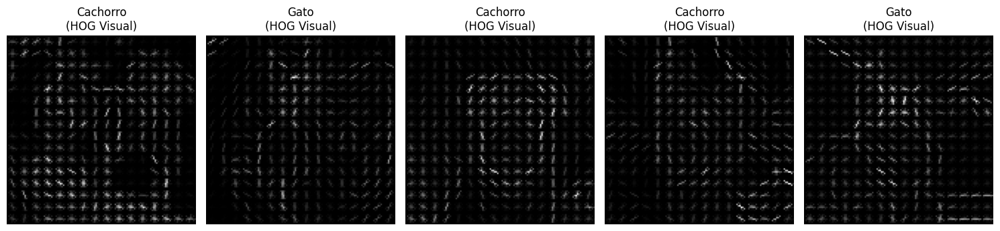

In [20]:
from skimage.feature import hog
import matplotlib.pyplot as plt
import cv2
import numpy as np

def plot_hog_samples(X_raw, y_data, img_size, n=5):
    """
    Pega imagens originais, calcula o HOG na hora com visualize=True e mostra o resultado.
    """
    plt.figure(figsize=(15, 5))
    
    n = min(n, len(X_raw))
    indices = np.random.randint(0, len(X_raw), n)
    
    for i, idx in enumerate(indices):
        plt.subplot(1, n, i+1)
        
        # 1. Reconstrói a imagem original
        image = X_raw[idx].reshape(img_size[0], img_size[1], 3)
        
        # 2. Converte para Cinza (HOG precisa disso)
        # Assumindo que image está em BGR (padrão cv2) ou RGB. 
        # O cast para uint8 garante que o cv2 processe corretamente
        gray = cv2.cvtColor(image.astype('uint8'), cv2.COLOR_BGR2GRAY)
        
        # 3. Calcula HOG pedindo a imagem de volta (visualize=True)
        # IMPORTANTE: Use os mesmos parâmetros que você usou para treinar!
        _, hog_image = hog(gray, 
                           orientations=9, 
                           pixels_per_cell=(8, 8), 
                           cells_per_block=(2, 2), 
                           block_norm='L2-Hys', 
                           visualize=True)
        
        # 4. Plota a imagem HOG
        plt.imshow(hog_image, cmap='gray')
        
        label = "Cachorro" if y_data[idx] == 1 else "Gato"
        plt.title(f"{label}\n(HOG Visual)")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# --- COMO CHAMAR ---
# Note que passamos X_train (o original), NÃO o X_train_hog
plot_hog_samples(X_train, y_train, IMG_SIZE, n=5)

In [26]:
# True for all 5s, False for all other digits
y_train_dog = (y_train == 1)
y_test_dog  = (y_test == 1)

forest_clf = RandomForestClassifier(class_weight='balanced', random_state=42)

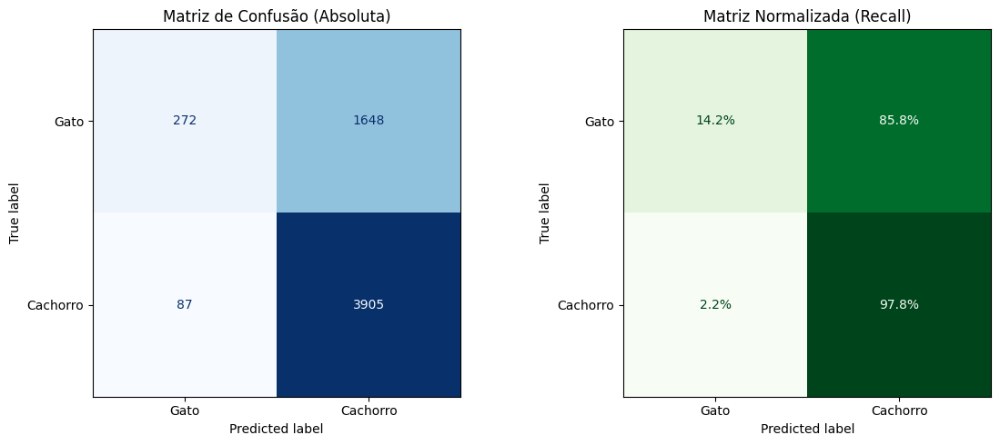

In [30]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# 1. Gera as predições via Cross-Validation usando as features HOG
y_train_pred_rf = cross_val_predict(forest_clf, X_train_hog, y_train_dog, cv=5)

# 2. Configura a plotagem lado a lado (Absoluta vs Normalizada)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Gráfico 1: Valores Absolutos (para ver a quantidade bruta de erros)
ConfusionMatrixDisplay.from_predictions(
    y_train_dog, 
    y_train_pred_rf, 
    display_labels=["Gato", "Cachorro"], # Nomes ficam mais bonitos que 0 e 1
    values_format="d", 
    cmap="Blues", 
    ax=ax1,
    colorbar=False
)
ax1.set_title("Matriz de Confusão (Absoluta)")

# Gráfico 2: Normalizada por Linha (Recall) - Requisito do PDF
# Mostra: "Dos que eram realmente Gatos, quantos % eu acertei?"
ConfusionMatrixDisplay.from_predictions(
    y_train_dog, 
    y_train_pred_rf, 
    display_labels=["Gato", "Cachorro"],
    normalize="true",  # Normaliza pelas linhas (Verdadeiro)
    values_format=".1%", 
    cmap="Greens", 
    ax=ax2,
    colorbar=False
)
ax2.set_title("Matriz Normalizada (Recall)")

plt.tight_layout()
plt.show()

In [31]:
precision = precision_score(y_train_dog, y_train_pred_rf)
recall = recall_score(y_train_dog, y_train_pred_rf)
f1 = f1_score(y_train_dog, y_train_pred_rf)

print("Métricas de desempenho:\n")
print("Precisão: \t\t %.2f"%(precision))
print("Revocação: \t\t %.2f"%(recall))
print("F1-score: \t\t %.2f"%(f1))

Métricas de desempenho:

Precisão: 		 0.70
Revocação: 		 0.98
F1-score: 		 0.82


In [33]:
y_probas_forest = cross_val_predict(forest_clf, X_train_hog, y_train_dog,
                                    cv=5, method="predict_proba")

y_scores_forest = y_probas_forest[:, 1]
precisions_forest, recalls_forest, thresholds_forest = precision_recall_curve(y_train_dog, y_scores_forest)

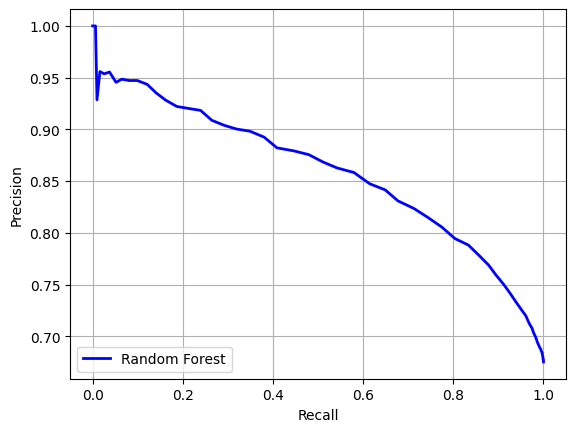

In [34]:
plt.plot(recalls_forest, precisions_forest, "b-", linewidth=2, label="Random Forest")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.legend(loc="lower left")
plt.draw()

In [35]:
# cálculo da área sob a curva ROC (ROC AUC):
roc_auc = roc_auc_score(y_train_dog, y_scores_forest)
print("ROC AUC:%.4f"%roc_auc)

ROC AUC:0.7642


In [36]:
fpr_forest, tpr_forest, thresholds = roc_curve(y_train_dog, y_scores_forest)

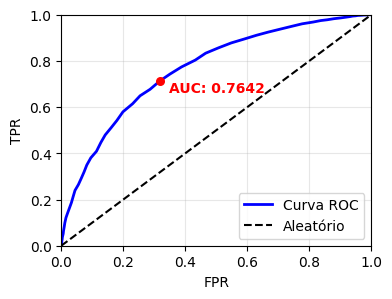

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

def plot_roc_clean(y_true, y_scores):
    # 1. Cálculos
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = roc_auc_score(y_true, y_scores)
    
    # 2. Encontrar o ponto de equilíbrio (Melhor balanço TPR vs FPR)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_fpr = fpr[optimal_idx]
    optimal_tpr = tpr[optimal_idx]
    
    plt.figure(figsize=(4, 3))
    
    # 3. Plota as linhas principais
    plt.plot(fpr, tpr, linewidth=2, label='Curva ROC', color='blue')
    plt.plot([0, 1], [0, 1], 'k--', label='Aleatório')
    
    # 4. Plota APENAS o ponto e o texto
    plt.scatter(optimal_fpr, optimal_tpr, color='red', s=30, zorder=5)
    
    # Adiciona o texto do AUC levemente deslocado para não ficar em cima da linha
    plt.text(
        optimal_fpr + 0.03, 
        optimal_tpr - 0.05, 
        f'AUC: {roc_auc:.4f}', 
        fontsize=10, 
        color='red',
        fontweight='bold'
    )

    # Configurações finais
    plt.axis([0, 1, 0, 1])
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)
    plt.show()

# Chamada da função com seus dados
plot_roc_clean(y_train_dog, y_scores_forest)

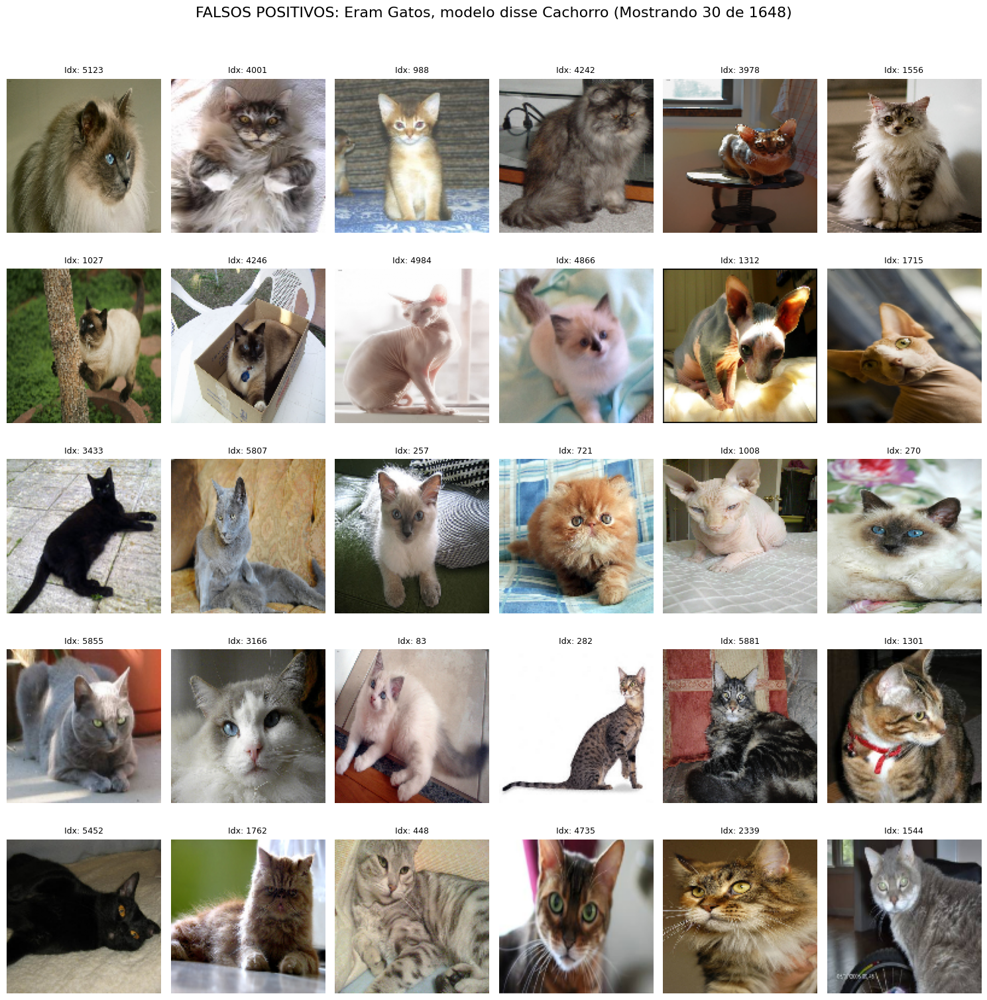

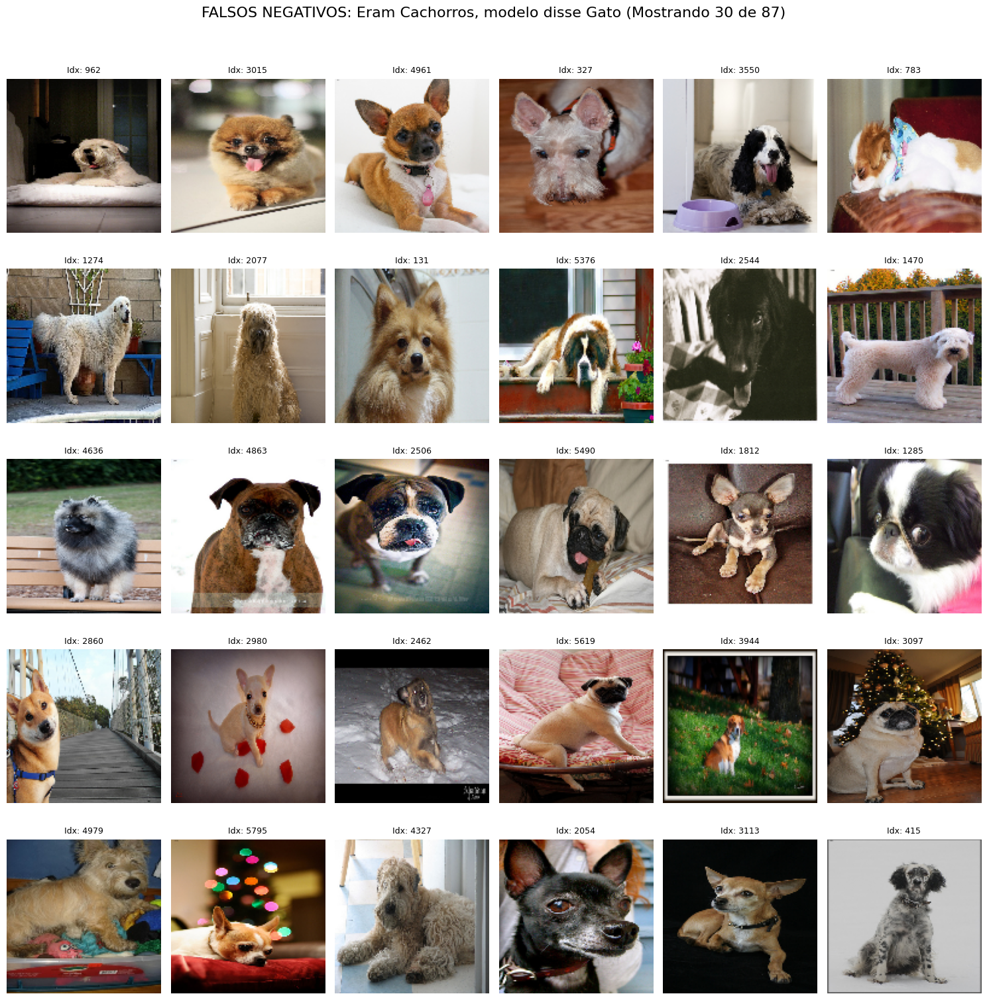

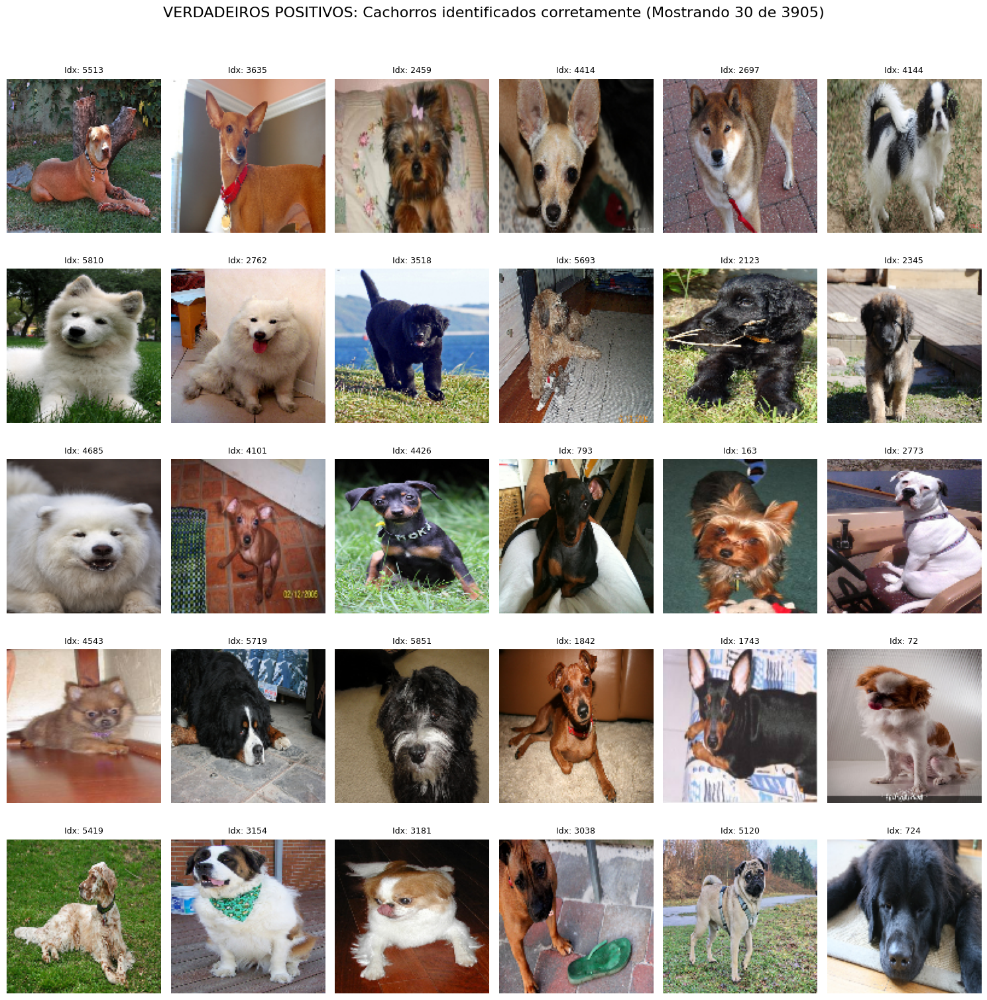

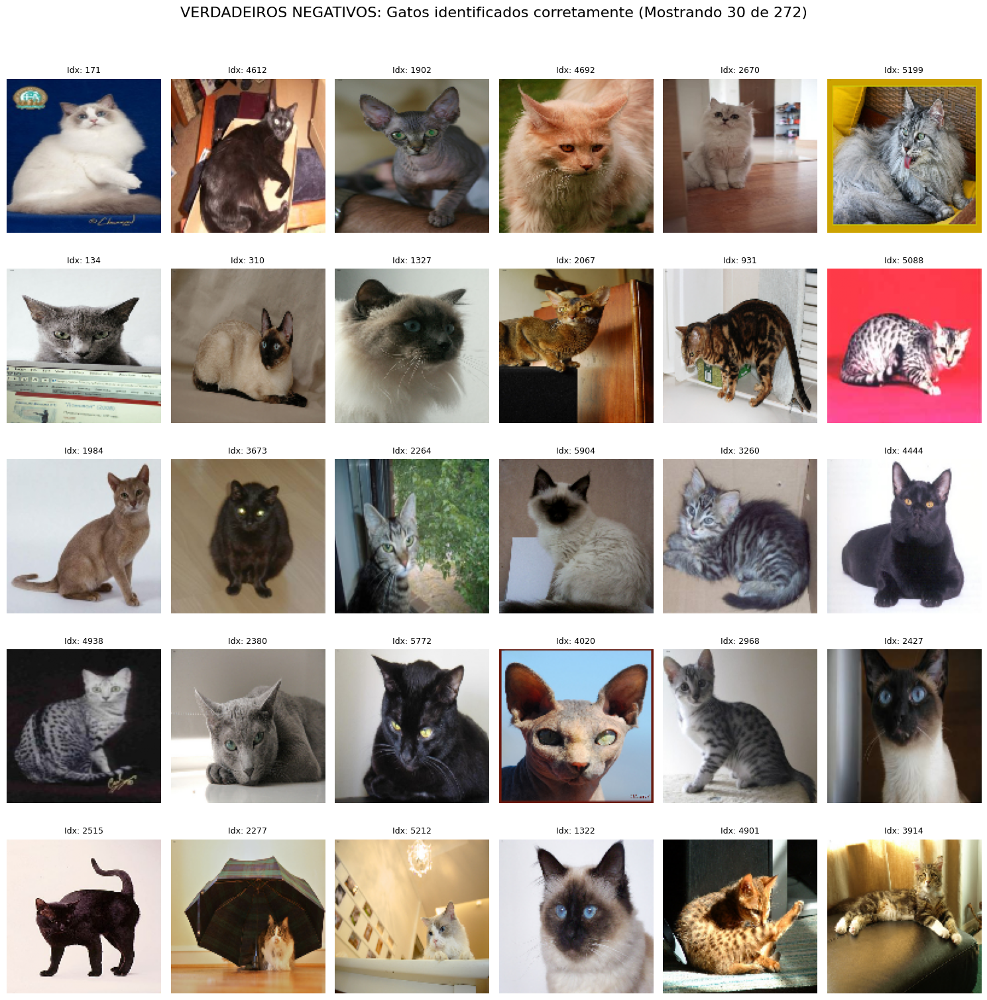

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import math

# ==============================================================================
# 1. CONFIGURAÇÕES INICIAIS
# ==============================================================================
# AJUSTE AQUI para o tamanho que você usou no treino (64 ou 128)
IMG_DIM = (128, 128) 
N_AMOSTRAS = 30  # Quantas imagens você quer ver por grupo

# ==============================================================================
# 2. FUNÇÃO DE PLOTAGEM (GALERIA)
# ==============================================================================
def plot_gallery(indices, X_data, title, n_imgs=30):
    if len(indices) == 0:
        print(f"--- Nenhum exemplo encontrado para: {title} ---")
        return

    # Seleciona n_imgs aleatórias (ou todas se tiver menos que n_imgs)
    n_display = min(len(indices), n_imgs)
    chosen_idxs = np.random.choice(indices, n_display, replace=False)
    
    # Calcula linhas e colunas para o grid
    cols = 6
    rows = math.ceil(n_display / cols)
    
    plt.figure(figsize=(15, 3 * rows))
    plt.suptitle(f"{title} (Mostrando {n_display} de {len(indices)})", fontsize=16, y=1.02)
    
    for i, idx in enumerate(chosen_idxs):
        ax = plt.subplot(rows, cols, i + 1)
        
        # Tenta fazer o reshape (assume RGB primeiro, depois Grayscale)
        try:
            # Tenta RGB (H, W, 3)
            img = X_data[idx].reshape(IMG_DIM[0], IMG_DIM[1], 3)
            # Normaliza para 0-1 se estiver em 0-255 (para o matplotlib não reclamar)
            if img.max() > 1:
                img = img.astype(float) / 255.0
            plt.imshow(img)
        except ValueError:
            # Tenta Grayscale (H, W)
            img = X_data[idx].reshape(IMG_DIM[0], IMG_DIM[1])
            plt.imshow(img, cmap='gray')
            
        plt.axis('off')
        plt.title(f"Idx: {idx}", fontsize=9)
    
    plt.tight_layout()
    plt.show()

# ==============================================================================
# 3. SEPARAÇÃO DOS ÍNDICES (QUADRANTES)
# ==============================================================================
# Garante que são arrays numpy para podermos filtrar
y_true = np.array(y_train_dog) # 1=Cachorro, 0=Gato
y_pred = np.array(y_train_pred_rf)

# --- GRUPO 1: FALSOS POSITIVOS (O ERRO CRÍTICO) ---
# Era GATO (0), mas o modelo disse CACHORRO (1)
fp_idxs = np.where((y_true == 0) & (y_pred == 1))[0]

# --- GRUPO 2: FALSOS NEGATIVOS ---
# Era CACHORRO (1), mas o modelo disse GATO (0)
fn_idxs = np.where((y_true == 1) & (y_pred == 0))[0]

# --- GRUPO 3: VERDADEIROS POSITIVOS (ACERTOU CÃO) ---
tp_idxs = np.where((y_true == 1) & (y_pred == 1))[0]

# --- GRUPO 4: VERDADEIROS NEGATIVOS (ACERTOU GATO) ---
tn_idxs = np.where((y_true == 0) & (y_pred == 0))[0]

# ==============================================================================
# 4. EXIBIÇÃO
# ==============================================================================

# Onde o modelo está "inventando" cachorros (Seu problema atual)
plot_gallery(fp_idxs, X_train, 
             title="FALSOS POSITIVOS: Eram Gatos, modelo disse Cachorro")

# Onde o modelo está "perdendo" cachorros
plot_gallery(fn_idxs, X_train, 
             title="FALSOS NEGATIVOS: Eram Cachorros, modelo disse Gato")

# O que ele aprendeu certo sobre Cachorros
plot_gallery(tp_idxs, X_train, 
             title="VERDADEIROS POSITIVOS: Cachorros identificados corretamente")

# O que ele aprendeu certo sobre Gatos
plot_gallery(tn_idxs, X_train, 
             title="VERDADEIROS NEGATIVOS: Gatos identificados corretamente")

In [44]:
forest_clf.fit(X_train_hog, y_train_dog)

RandomForestClassifier(class_weight='balanced', random_state=42)

Total de amostras no teste: 1478
Matriz de confusão (Teste HOG):
 [[ 61 419]
 [ 19 979]]


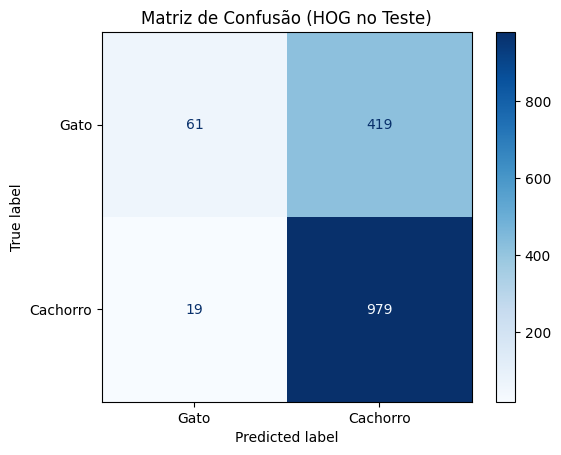

In [46]:
y_test_pred_hog = forest_clf.predict(X_test_hog)

# 3. Agora gera a matriz
cm_test = confusion_matrix(y_test_dog, y_test_pred_hog)

print(f"Total de amostras no teste: {len(y_test_dog)}")
print("Matriz de confusão (Teste HOG):\n", cm_test)

disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Gato', 'Cachorro'])
disp.plot(cmap='Blues')
plt.title("Matriz de Confusão (HOG no Teste)")
plt.show()

In [48]:
precision = precision_score(y_train_dog, y_train_pred_rf)
recall = recall_score(y_train_dog, y_train_pred_rf)
f1 = f1_score(y_train_dog, y_train_pred_rf)

print("Métricas de desempenho:\n")
print("Precisão: \t\t %.2f"%(precision))
print("Revocação: \t\t %.2f"%(recall))
print("F1-score: \t\t %.2f"%(f1))

Métricas de desempenho:

Precisão: 		 0.70
Revocação: 		 0.98
F1-score: 		 0.82


In [50]:
from sklearn.metrics import classification_report, accuracy_score

acc = accuracy_score(y_test_dog, y_test_pred_hog)
print(f"=== RESULTADO FINAL NO TESTE ===")
print(f"Acurácia Global: {acc:.2%}")

report = classification_report(y_test_dog, y_test_pred_hog, target_names=['Gato', 'Cachorro'])

print("Relatório de Classificação Detalhado:")
print(report)

=== RESULTADO FINAL NO TESTE ===
Acurácia Global: 70.37%
Relatório de Classificação Detalhado:
              precision    recall  f1-score   support

        Gato       0.76      0.13      0.22       480
    Cachorro       0.70      0.98      0.82       998

    accuracy                           0.70      1478
   macro avg       0.73      0.55      0.52      1478
weighted avg       0.72      0.70      0.62      1478

